In [6]:
import numpy as np
import pandas as pd
df = pd.read_csv('/kaggle/input/100-bird-species/birds.csv')
print(df.head())

   class id                      filepaths           labels data set  \
0       0.0  train/ABBOTTS BABBLER/001.jpg  ABBOTTS BABBLER    train   
1       0.0  train/ABBOTTS BABBLER/007.jpg  ABBOTTS BABBLER    train   
2       0.0  train/ABBOTTS BABBLER/008.jpg  ABBOTTS BABBLER    train   
3       0.0  train/ABBOTTS BABBLER/009.jpg  ABBOTTS BABBLER    train   
4       0.0  train/ABBOTTS BABBLER/002.jpg  ABBOTTS BABBLER    train   

        scientific name  
0  MALACOCINCLA ABBOTTI  
1  MALACOCINCLA ABBOTTI  
2  MALACOCINCLA ABBOTTI  
3  MALACOCINCLA ABBOTTI  
4  MALACOCINCLA ABBOTTI  


We use standard Python os library to traverse directory and load each image with PIL

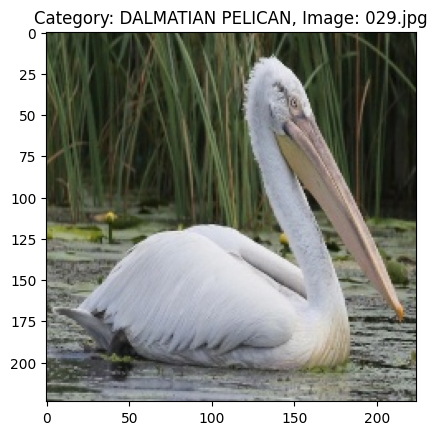

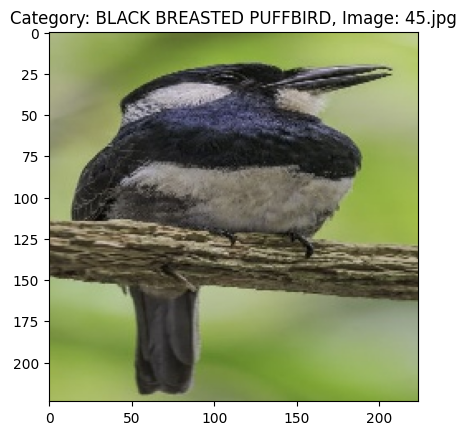

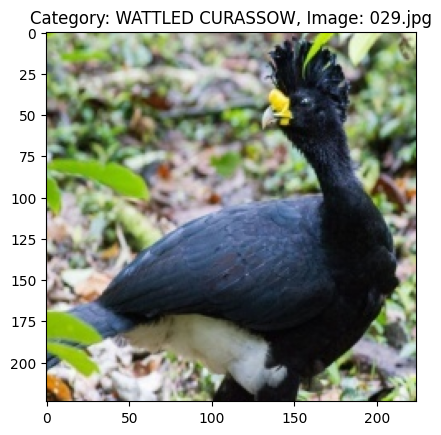

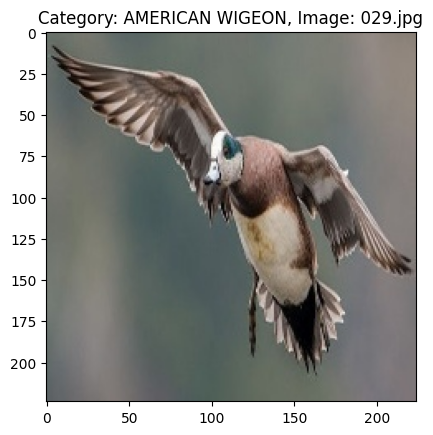

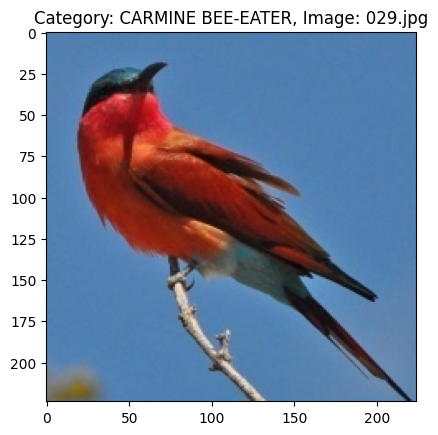

...

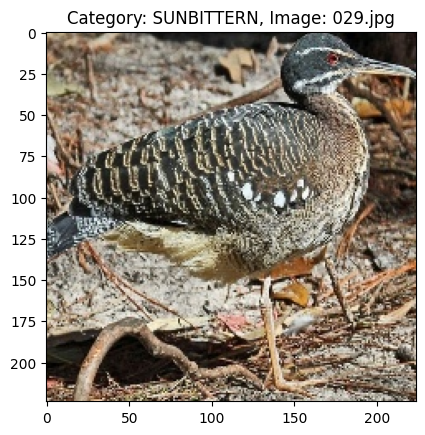

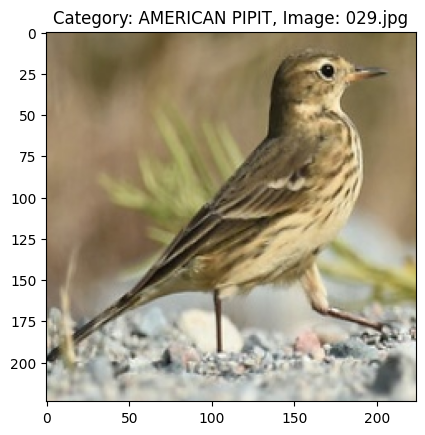

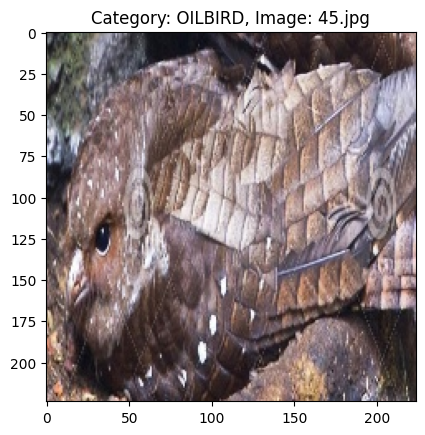

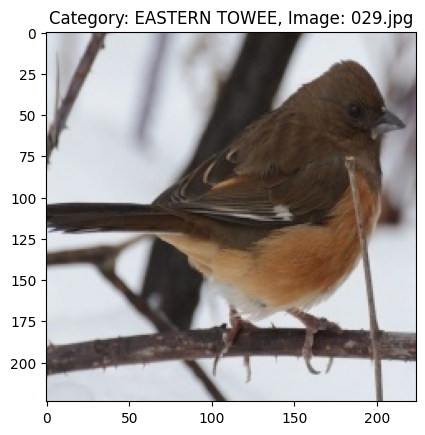

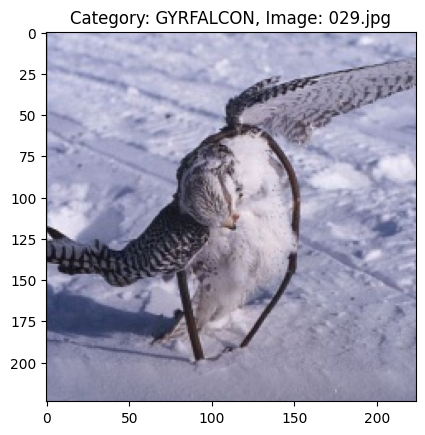

In [ ]:
import os
from PIL import Image
import matplotlib.pyplot as plt

data_dir = '/kaggle/input/100-bird-species/train'
categories = os.listdir(data_dir)

for category in categories:
    category_path = os.path.join(data_dir, category)
    images = os.listdir(category_path)
    
    for img_name in images:
        img_path = os.path.join(category_path, img_name)
        try:
            img = Image.open(img_path)
            # Display the image using Matplotlib
            plt.imshow(img)
            plt.title(f"Category: {category}, Image: {img_name}")
            plt.show()
            break  # To display only one image per category
            break  # To display only one image per category
        except Exception as e:
            print(f"Error opening image {img_path}: {e}")

#we create training and test sets from the images, we can use the train_test_split function from the scikit-learn library. This feature is very handy for splitting data info training and testing sets.

In [9]:
from sklearn.model_selection import train_test_split
from PIL import Image
import matplotlib.pyplot as plt
# List for storing image paths and labels
image_paths = []
labels = []

# Browse each category
for category in categories:
    category_path = os.path.join(data_dir, category)
    images = os.listdir(category_path)
    
    # Browse each image in the category
    for img_name in images:
        img_path = os.path.join(category_path, img_name)
        image_paths.append(img_path)
        labels.append(category)
        
# Convert lists to numpy arrays for easier handling
image_paths = np.array(image_paths)
labels = np.array(labels)
#Split data into training and testing sets
train_paths, test_paths, train_labels, test_labels = train_test_split(image_paths, labels, test_size=0.2, random_state=42, stratify=labels)

# Check set sizes
print(f"Number of training images: {len(train_paths)}")
print(f"Number of test images: {len(test_paths)}")

Number of training images: 67708
Number of test images: 16927


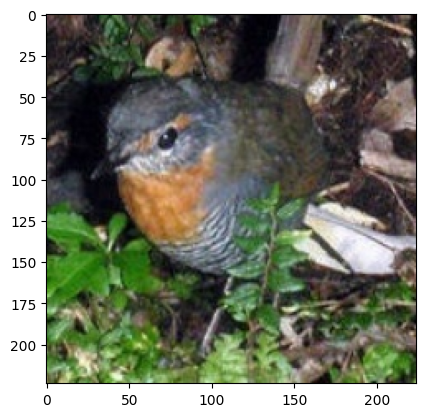

In [10]:
# uploading an image for verification
img = Image.open(train_paths[0])
plt.imshow(img)
plt.show()

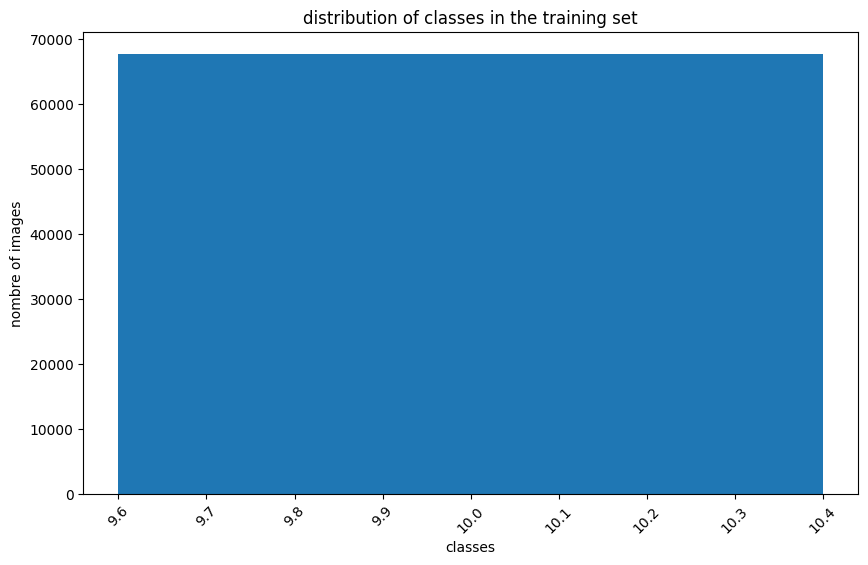

In [17]:
#Show class distribution in training set
class_distribution = [0] * 10
for label in train_paths:
    class_distribution[0] +=1 #Increment count for corresponding class
plt.figure(figsize=(10, 6))
plt.bar(len(class_distribution), class_distribution)
plt.title('distribution of classes in the training set')
plt.xlabel('classes')
plt.ylabel('nombre of images')
plt.xticks(rotation=45)
plt.show()


#data preprocessing
#normalize image pixels by scaling 0 and 1

In [26]:
# Assuming we have a list of image paths and corresponding labels
image_paths = [] # List of image paths
labels = []  # List of corresponding labels

# Load images and normalize pixel values
images = [data_dir for path in image_paths]
images = np.array(images).astype('float32') / 255.0  # Normalize pixel values to 0-1


In [28]:
#Calculate class distribution
num_classes = len(set(labels))  # Determine the number of unique classes
class_distribution = [0] * num_classes

for label in labels:
    class_distribution[label] += 1


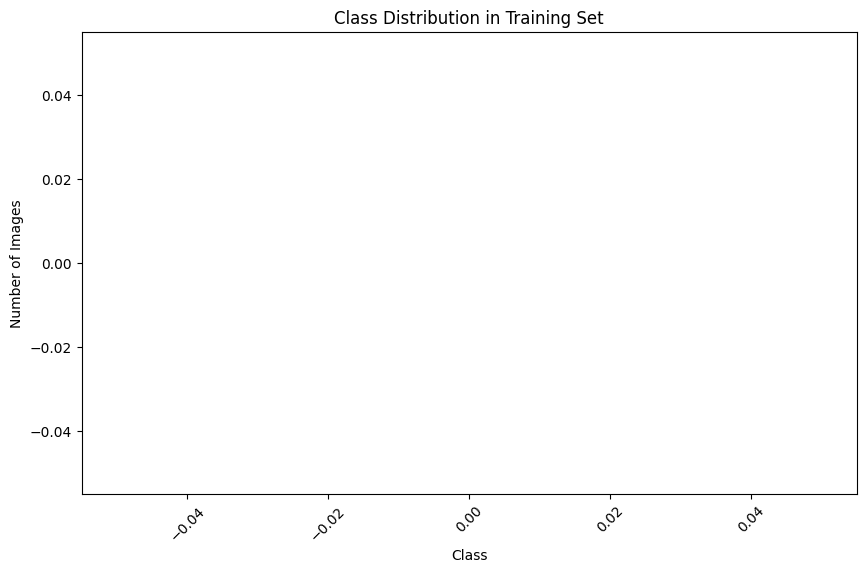

In [29]:
#Visualize class distribution
plt.figure(figsize=(10, 6))
plt.bar(range(num_classes), class_distribution)
plt.title('Class Distribution in Training Set')
plt.xlabel('Class')
plt.ylabel('Number of Images')
plt.xticks(rotation=45)
plt.show()
